In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D,Lambda
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random
from keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint


In [2]:
datadir = r'C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth', None) 
data.head()


,center,left,right,steering,throttle,reverse,speed
0,center_image_location,left_image_location,right_image_location,steering_angle,throttle,brake,speed
1,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_382.jpg,0,0,0,0.6497864
2,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_670.jpg,0,0,0,0.6279418
3,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_724.jpg,0,0,0,0.6229097
4,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_792.jpg,0,0,0,0.6191623


In [3]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

# Apply the path_leaf function
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

# Update image paths to include the full directory path
image_dir = r'C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG'
data['center'] = data['center'].apply(lambda x: os.path.join(image_dir, x))
data['left'] = data['left'].apply(lambda x: os.path.join(image_dir, x))
data['right'] = data['right'].apply(lambda x: os.path.join(image_dir, x))

data.head()


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_image_location,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_image_location,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_image_location,steering_angle,throttle,brake,speed
1,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_382.jpg,0,0,0,0.6497864
2,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_670.jpg,0,0,0,0.6279418
3,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_724.jpg,0,0,0,0.6229097
4,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG\right_2018_07_16_17_11_43_792.jpg,0,0,0,0.6191623


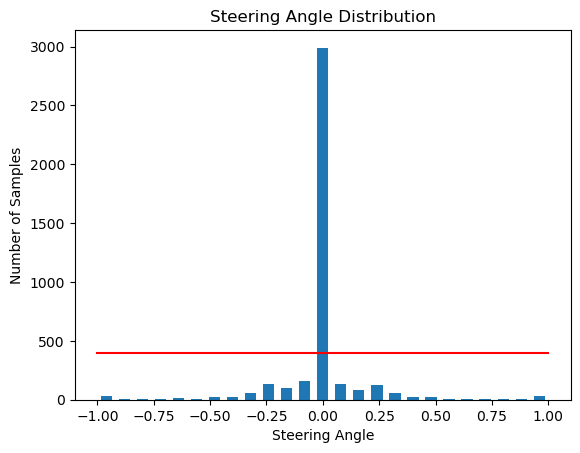

In [4]:
# Check if there are any non-numeric values or missing values in the 'steering' column
data['steering'] = pd.to_numeric(data['steering'], errors='coerce')

# Drop rows with NaN values (if any) after conversion
data = data.dropna(subset=['steering'])

# Now, proceed with the histogram plot
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5

# Plotting the histogram
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin), color='red')
plt.xlabel('Steering Angle')
plt.ylabel('Number of Samples')
plt.title('Steering Angle Distribution')
plt.show()


In [5]:

print('total data:', len(data))
print(data.shape)

total data: 4053
(4053, 7)


In [6]:
from sklearn.utils import shuffle

remove_list = []
for j in range(num_bins):
    # Create a list of indices for data points within each bin
    list_ = [
        i for i in range(len(data['steering']))
        if data['steering'].iloc[i] >= bins[j] and data['steering'].iloc[i] <= bins[j + 1]
    ]
    # Shuffle the list to ensure random sampling
    list_ = shuffle(list_)
    # Retain only a specified number of samples per bin and remove the rest
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

# Print the number of samples removed and drop them from the DataFrame
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))


removed: 2590
remaining: 1463


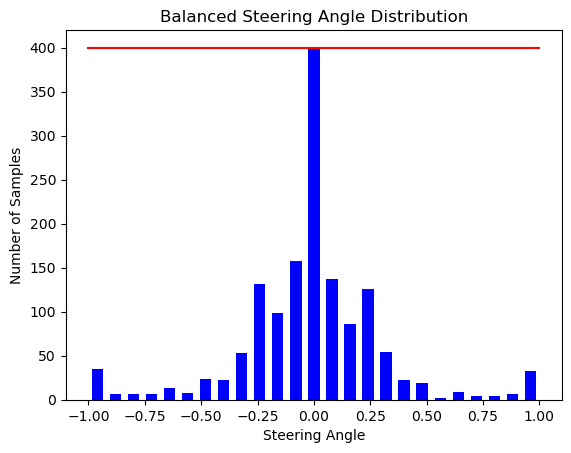

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Recalculate the histogram after balancing the data
hist, _ = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5

# Plotting the histogram to visualize the balanced data
plt.bar(center, hist, width=0.05, color='blue')
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin), color='red')
plt.xlabel('Steering Angle')
plt.ylabel('Number of Samples')
plt.title('Balanced Steering Angle Distribution')
plt.show()


In [8]:
def load_img_steering(datadir, df):
    image_path = []
    steering = []

    # Iterate through the DataFrame to get image paths and steering angles
    for i in range(len(df)):
        indexed_data = df.iloc[i]
        center, left, right = indexed_data['center'], indexed_data['left'], indexed_data['right']
        
        # Append center image and corresponding steering angle
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data['steering']))

        # Append left image with a slight steering adjustment
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data['steering']) + 0.15)

        # Append right image with a slight steering adjustment
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data['steering']) - 0.15)

    # Convert lists to numpy arrays for easier handling
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)

    return image_paths, steerings


In [9]:
# Use the existing `datadir` path to load image paths and steering angles
image_paths, steerings = load_img_steering(
    r'C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\track-master\IMG',
    data
)


In [10]:
len(image_paths)

4389

In [11]:
len(steerings)

4389

In [12]:
# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(
    image_paths, steerings, test_size=0.2, random_state=6
)

# Print the number of samples in each set
print('Training Samples: {}\nValidation Samples: {}'.format(len(X_train), len(X_valid)))


Training Samples: 3511
Validation Samples: 878


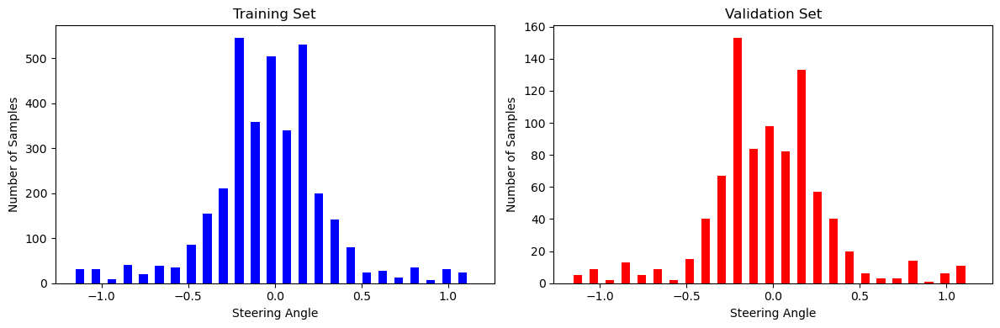

In [13]:
# Plot histograms of steering angles for the training and validation sets
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Histogram for the training set
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training Set')
axes[0].set_xlabel('Steering Angle')
axes[0].set_ylabel('Number of Samples')

# Histogram for the validation set
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation Set')
axes[1].set_xlabel('Steering Angle')
axes[1].set_ylabel('Number of Samples')

plt.tight_layout()  # Adjust the spacing between plots
plt.show()


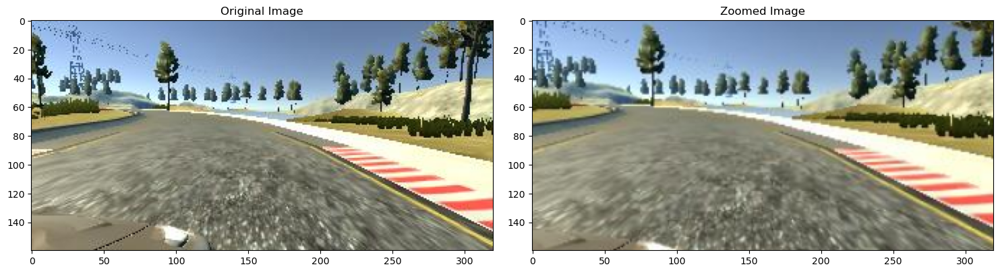

In [14]:
# Function to apply zoom augmentation
def zoom(image):
    # Create a zoom augmenter with a scale range between 1 and 1.3
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

# Select a random image from the image paths
random_index = random.randint(0, len(image_paths) - 1)  # Ensure the index is within bounds
image = image_paths[random_index]
original_image = mpimg.imread(image)

# Apply the zoom augmentation
zoomed_image = zoom(original_image)

# Plot the original and zoomed images side-by-side
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

plt.show()


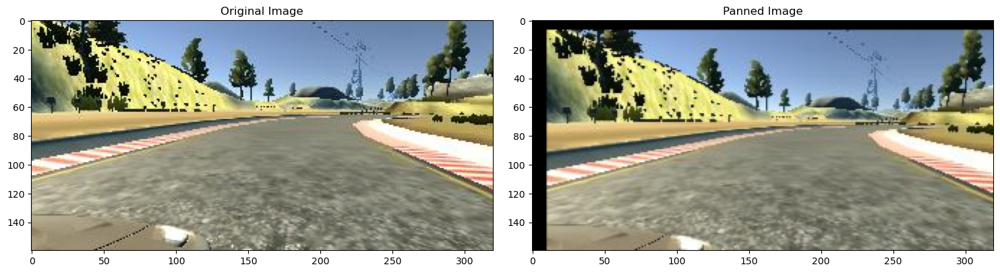

In [15]:
# Function to apply panning augmentation
def pan(image):
    # Create a panning augmenter with a translation range of -10% to +10% for both x and y axes
    pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

# Select a random image from the image paths
random_index = random.randint(0, len(image_paths) - 1)  # Ensure the index is within bounds
image = image_paths[random_index]
original_image = mpimg.imread(image)

# Apply the panning augmentation
panned_image = pan(original_image)

# Plot the original and panned images side-by-side
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

plt.show()


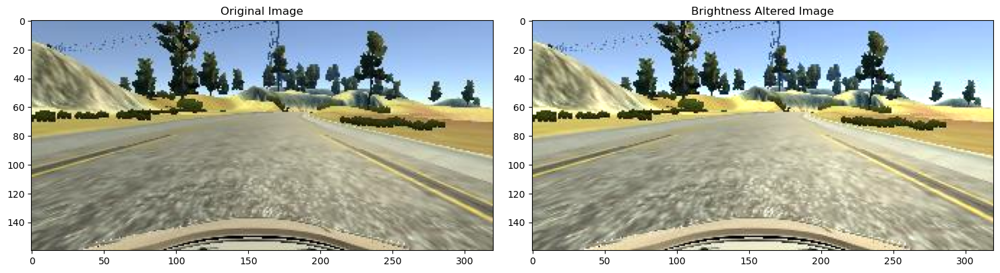

In [16]:
# Function to randomly alter the brightness of an image
def img_random_brightness(image):
    # Create a brightness augmenter with a multiplier range from 0.2 to 1.2
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

# Select a random image from the image paths
random_index = random.randint(0, len(image_paths) - 1)  # Ensure the index is within bounds
image = image_paths[random_index]
original_image = mpimg.imread(image)

# Apply the brightness augmentation
brightness_altered_image = img_random_brightness(original_image)

# Plot the original and brightness-altered images side-by-side
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

plt.show()


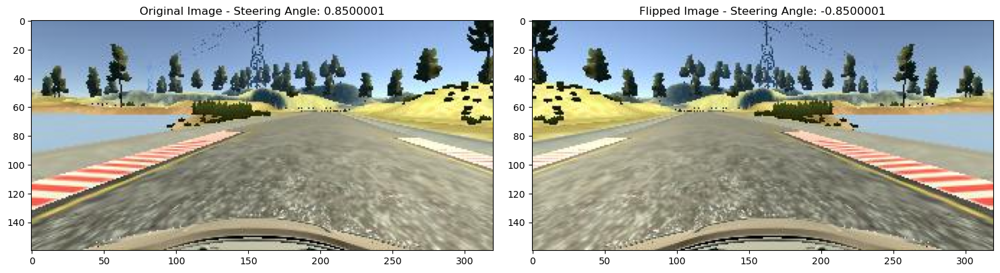

In [17]:
# Function to horizontally flip an image and invert the steering angle
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)  # Flip the image horizontally
    steering_angle = -steering_angle  # Invert the steering angle
    return image, steering_angle

# Select a random image from the image paths
random_index = random.randint(0, len(image_paths) - 1)  # Ensure the index is within bounds
image = image_paths[random_index]
steering_angle = steerings[random_index]

# Load the original image and apply the flip
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

# Plot the original and flipped images side-by-side
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - Steering Angle: ' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - Steering Angle: ' + str(flipped_steering_angle))

plt.show()


In [18]:
# Function to apply random augmentations to an image and its corresponding steering angle
def random_augment(image, steering_angle):
    # Load the image from the file path
    image = mpimg.imread(image)

    # Apply augmentations with a 50% probability each
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


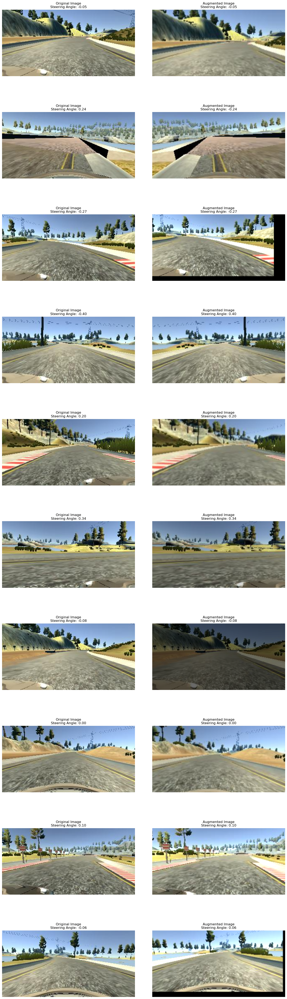

In [19]:
# Number of columns and rows for the plot grid
ncol = 2
nrow = 10

# Create a figure with a grid of subplots
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout(pad=3.0)  # Add padding between plots for better readability

# Loop to display 10 pairs of original and augmented images
for i in range(nrow):
    randnum = random.randint(0, len(image_paths) - 1)  # Ensure the index is within bounds
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    # Load the original image
    original_image = mpimg.imread(random_image)
    
    # Apply random augmentations to the image and get the updated steering angle
    augmented_image, steering = random_augment(random_image, random_steering)

    # Display the original image
    axs[i, 0].imshow(original_image)
    axs[i, 0].set_title("Original Image\nSteering Angle: {:.2f}".format(random_steering))
    axs[i, 0].axis('off')  # Hide axes for better visualization

    # Display the augmented image
    axs[i, 1].imshow(augmented_image)
    axs[i, 1].set_title("Augmented Image\nSteering Angle: {:.2f}".format(steering))
    axs[i, 1].axis('off')  # Hide axes for better visualization

plt.show()


In [20]:
def img_preprocess(img):
    # Crop the image to focus on the road
    img = img[60:135, :, :]
    
    # Convert the image from RGB to YUV color space
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    
    # Apply Gaussian blur to reduce noise
    img = cv2.GaussianBlur(img, (3, 3), 0)
    
    # Resize the image to 200x66 pixels
    img = cv2.resize(img, (200, 66))
    
    # Normalize the image to [0, 1]
    img = img / 255.0
    
    return img


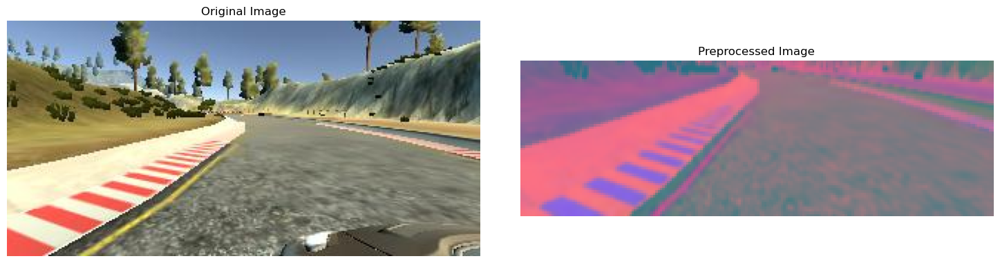

In [21]:
# Select an image from the image paths for demonstration
image = image_paths[100]
original_image = mpimg.imread(image)

# Preprocess the image using the img_preprocess function
preprocessed_image = img_preprocess(original_image)

# Plot the original and preprocessed images side-by-side
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# Display the original image
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[0].axis('off')  # Hide axes for a cleaner look

# Display the preprocessed image
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')
axs[1].axis('off')  # Hide axes for a cleaner look

plt.show()


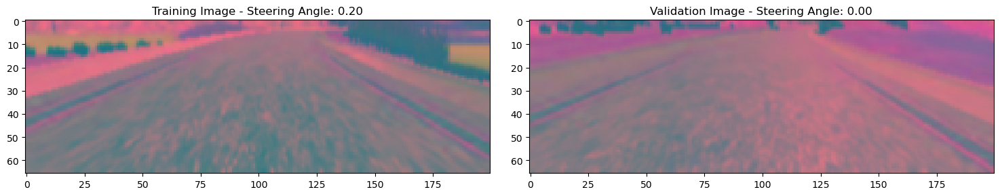

In [22]:
# Preprocess the entire training and validation datasets
X_train_preprocessed = np.array([img_preprocess(mpimg.imread(img)) for img in X_train])
X_valid_preprocessed = np.array([img_preprocess(mpimg.imread(img)) for img in X_valid])

# Sample one image from the training and validation sets
x_train_gen = X_train_preprocessed[0:1]
y_train_gen = y_train[0:1]
x_valid_gen = X_valid_preprocessed[0:1]
y_valid_gen = y_valid[0:1]

# Visualize the sample images
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image - Steering Angle: {:.2f}'.format(y_train_gen[0]))

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image - Steering Angle: {:.2f}'.format(y_valid_gen[0]))

plt.show()


In [23]:
from keras.layers import Input, Normalization
import tensorflow as tf

def create_pilotnet():
    model = Sequential()
    # Input layer
    model.add(Input(shape=(66, 200, 3)))
    # Normalization layer
    normalization_layer = Normalization(axis=-1)
    normalization_layer.adapt(tf.random.normal((1, 66, 200, 3)))
    model.add(normalization_layer)
    # Convolutional layers
    model.add(Conv2D(24, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    # Flatten the output
    model.add(Flatten())
    # Fully connected layers
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    # Output layer for the steering angle
    model.add(Dense(1))
    return model


In [24]:
# Create the model
model = create_pilotnet()

# Compile the model with the Adam optimizer and Mean Squared Error loss
model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse')


In [25]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define a temporary save path with `.keras` (required by ModelCheckpoint)
temp_save_path = r'C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\model\pilotnet_model.keras'

# Add a checkpoint callback to save the best model during training in `.keras` format
checkpoint = ModelCheckpoint(
    filepath=temp_save_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)


In [26]:
# Train the model using the training and validation datasets
history = model.fit(
    X_train_preprocessed, y_train,
    epochs=10,  # Adjust epochs as needed
    validation_data=(X_valid_preprocessed, y_valid),
    batch_size=32,  # Adjust batch size as needed
    shuffle=True,
    callbacks=[checkpoint]
)


Epoch 1/10
108/110 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1309
Epoch 1: val_loss improved from inf to 0.08897, saving model to C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\model\pilotnet_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1304 - val_loss: 0.0890
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0764
Epoch 2: val_loss improved from 0.08897 to 0.05677, saving model to C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\model\pilotnet_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0763 - val_loss: 0.0568
Epoch 3/10
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0528
Epoch 3: val_loss improved from 0.05677 to 0.04700, saving model to C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\model\pilotnet_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0528 - val_loss: 0.0470
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0448


In [60]:
# Define the final .h5 save path
final_save_path = r'C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\model\pilotnet_model.h5'

# Load the `.keras` model from the temporary save path
model = keras.models.load_model(temp_save_path)

# Save the model explicitly in .h5 format
model.save(final_save_path)

print(f'Model successfully saved in .h5 format at: {final_save_path}')


Model successfully saved in .h5 format at: C:\Users\RAHUL GOSWAMI\Documents\NCI\Practicum\Practicum Part 2_ Project\model\pilotnet_model.h5


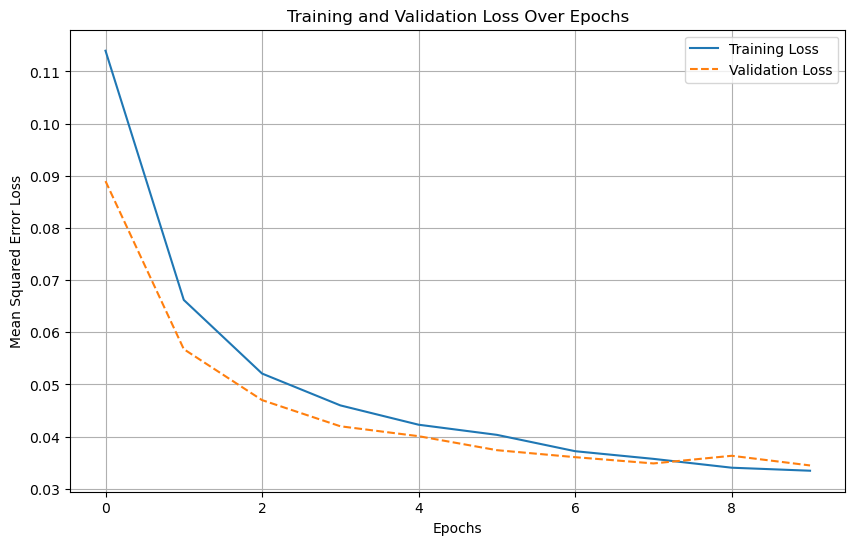

In [27]:
import matplotlib.pyplot as plt

# Plot the training and validation loss over epochs
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='--')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


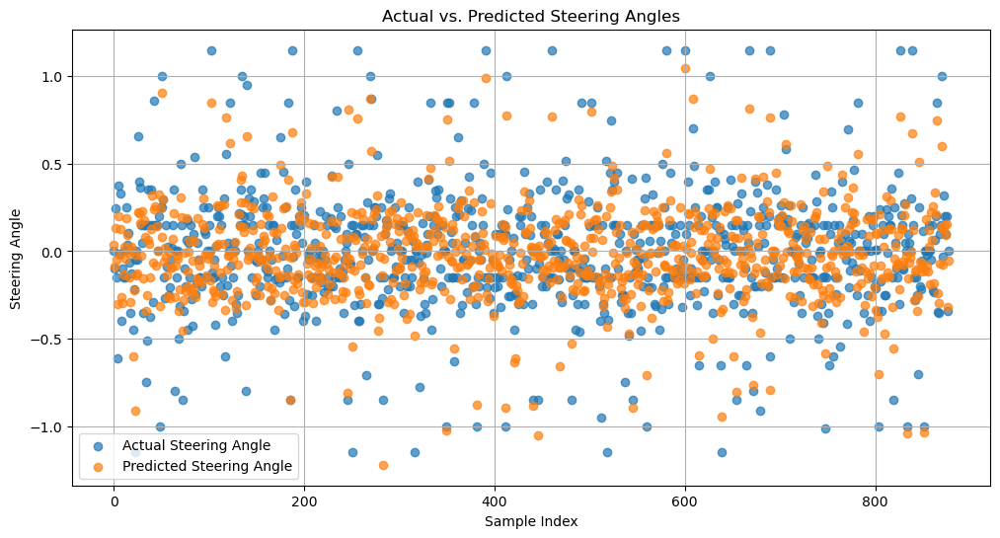

In [28]:
import numpy as np

# Generate predictions for the validation set
y_pred = model.predict(X_valid_preprocessed)

# Plot the actual vs. predicted steering angles
plt.figure(figsize=(12, 6))
plt.scatter(range(len(y_valid)), y_valid, label="Actual Steering Angle", alpha=0.7)
plt.scatter(range(len(y_pred)), y_pred, label="Predicted Steering Angle", alpha=0.7)
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.title("Actual vs. Predicted Steering Angles")
plt.legend()
plt.grid(True)
plt.show()


In [29]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Make predictions on validation set
y_pred = model.predict(X_valid_preprocessed)

# Calculate MAE and RMSE
mae = mean_absolute_error(y_valid, y_pred)
rmse = np.sqrt(mean_squared_error(y_valid, y_pred))

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Mean Absolute Error (MAE): 0.1383256169541777
Root Mean Squared Error (RMSE): 0.1856960316443139


In [30]:
print(f"Training Loss: {history.history['loss'][-1]}")
print(f"Validation Loss: {history.history['val_loss'][-1]}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


Training Loss: 0.033470090478658676
Validation Loss: 0.03448301926255226
Mean Absolute Error (MAE): 0.1383256169541777
Root Mean Squared Error (RMSE): 0.1856960316443139


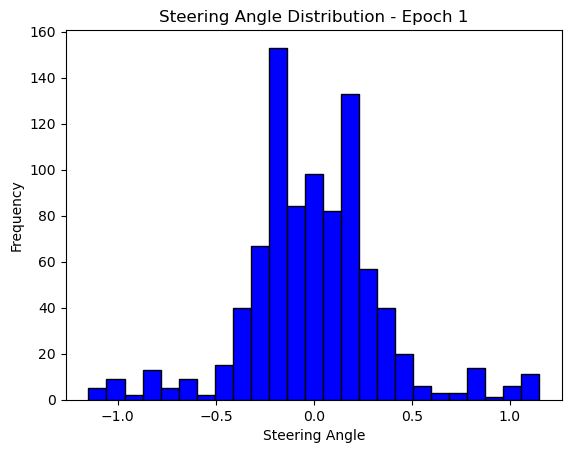

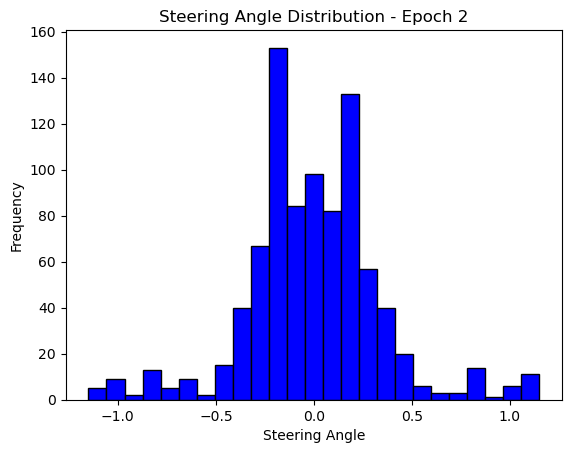

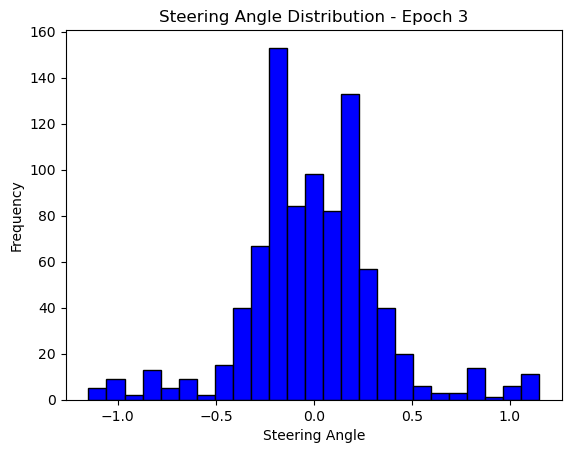

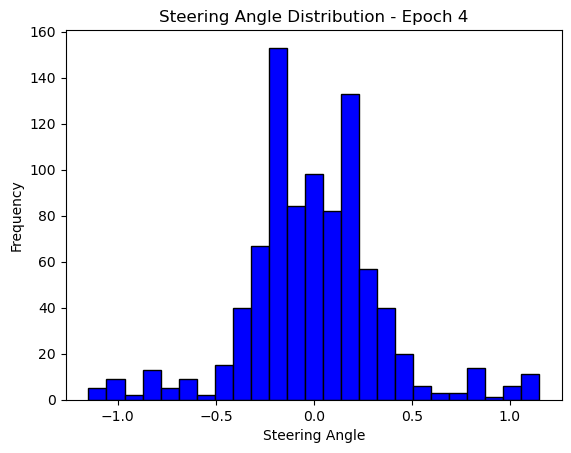

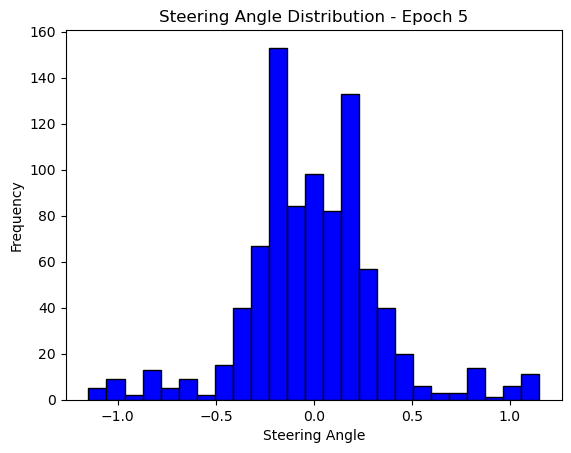

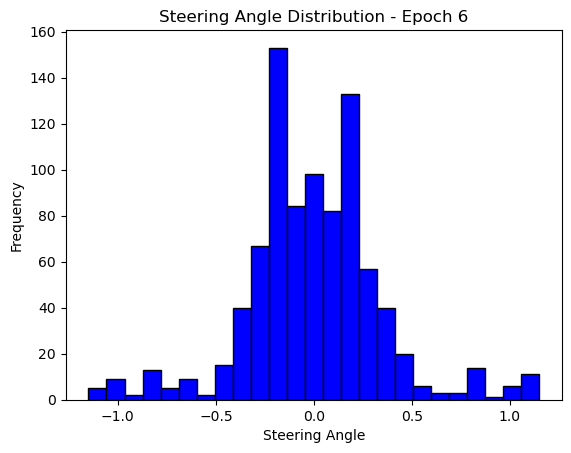

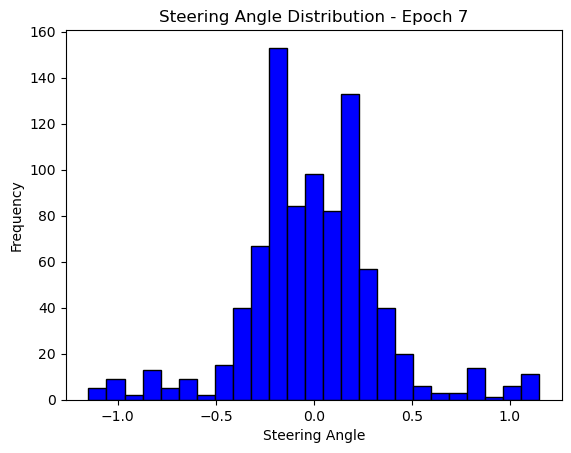

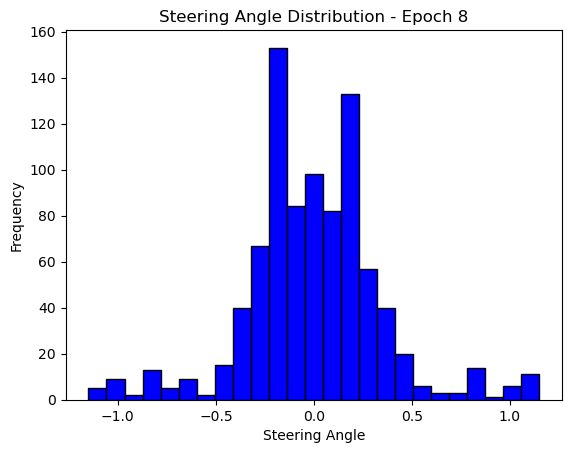

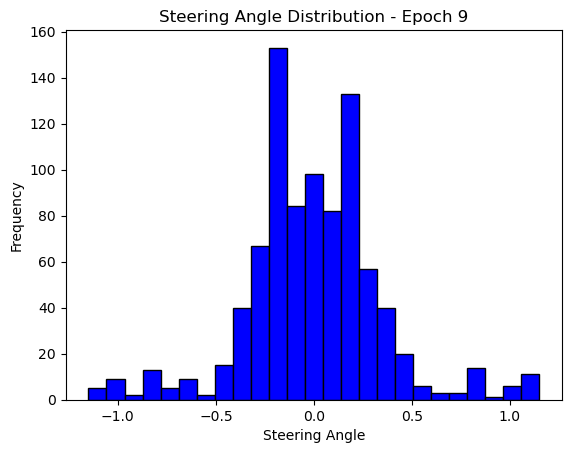

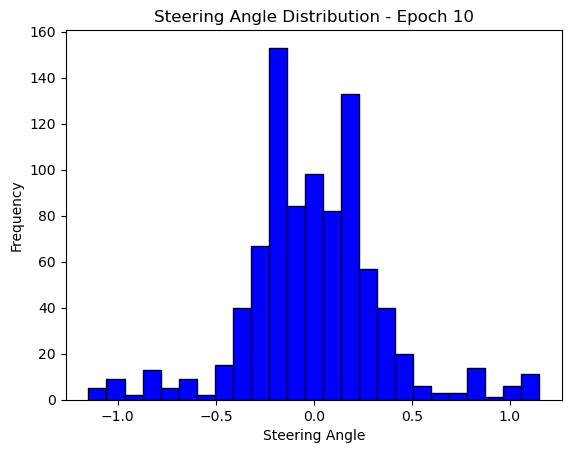

In [31]:
# Plot the steering angle distribution for each epoch
for epoch in range(10):  # assuming 10 epochs
    plt.hist(y_valid, bins=num_bins, color='blue', edgecolor='black')
    plt.title(f"Steering Angle Distribution - Epoch {epoch+1}")
    plt.xlabel('Steering Angle')
    plt.ylabel('Frequency')
    plt.show()


In [32]:
import time

# Measure inference time
start_time = time.time()
model.predict(X_valid_preprocessed)
end_time = time.time()

inference_time = end_time - start_time
print(f"Inference Time for the model: {inference_time} seconds")


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Inference Time for the model: 0.4687373638153076 seconds
